## Cleaning Speedy Weather Reanalysis
Here I select the target variables (prognostic, forcing, diagnostic)

In [1]:
using NCDatasets
using Statistics
using Plots
using CairoMakie
using NPZ
using Missings
using Dates

### Load in Files & determine length of time
We discard the first 9 years to account for spin up and save only 15 years worth of data to save as npz file 

LUCIE only uses 10 years for training, and 600 hours for evaluation hence 5 years minus 600 hours for out-of-sample use 

In [3]:
ds = NCDataset("one_layer_primitive_wet/output.nc")
oro_saved = NCDataset("orography_T30.nc")
tisr_saved = npzread("tisr_T30_regridded_20010101.npz")

#length of time
start_t = 13149 # 2010-01-01 start 
finish_t = start_t + 365*4*15 #15 years
all_time = ds["time"][:]
times = ds["time"][start_t : finish_t]
time_len = size(times)[1]
lat_count = 48
lon_count = 96
year_steps = 1460

print(time_len)

21901

### Save Orography and TISR forcing variables

In [4]:
#Static orography cleaning for npz
oro = zeros(Float32, (lon_count, lat_count, time_len))
for i ∈ 1:time_len
    oro[:,:,i] = oro_saved["orography"][:,:]
end

oro_permuted = permutedims(oro, (3,2,1)) #ready to be saved
oro = nothing

#Preparing tisr for the full all dates
tisr_w_targetdims = tisr_saved["tisr"][:,:,:]
tisr_permute = permutedims(tisr_w_targetdims, (3,2,1))
size(tisr_permute)

tisr = zeros(Float32, (lon_count, lat_count, time_len))
for i ∈ 1:time_len
    idx = i%year_steps
    if idx == 0
        idx = year_steps
    end
    tisr[:,:, i] = tisr_permute[:,:, idx]
end

tisr_permuted = permutedims(tisr, (3,2,1))
tisr = nothing

### Select the prognostic and diagnostic variables
Save dictionary as .npz file

In [5]:
sp = ds["spres"][:, :, start_t:finish_t]
sp_exp = exp.(sp)
sp_nomissing = disallowmissing(sp_exp)
sp_permuted = permutedims(sp_nomissing, (3,2,1))
sp_nomissing = nothing; sp =  nothing; sp_exp = nothing;

temp = ds["temp"][:, :, 1, start_t:finish_t]
temp_nomissing = disallowmissing(temp)
temp_permuted = permutedims(temp_nomissing, (3,2,1))
temp_nomissing = nothing ;  temp = nothing

vor= ds["vor"][:, :, 1 , start_t:finish_t]
vor_nomissing = disallowmissing(vor)
vor_permuted = permutedims(vor_nomissing, (3,2,1))
vor_nomissing = nothing; vor = nothing;

div = ds["div"][:, :, 1 , start_t:finish_t]
div_nomissing = disallowmissing(div)
div_permuted = permutedims(div_nomissing, (3,2,1))
div_nomissing = nothing; v = nothing;

sh = ds["humid"][:, :, 1, start_t:finish_t]
sh_nomissing = disallowmissing(sh)
sh_permuted = permutedims(sh_nomissing, (3,2,1))
sh_nomissing = nothing; sh = nothing;

tp = ds["precip_cond"][:, :, start_t:finish_t] - ds["precip_cond"][:, :, (start_t-1):(finish_t-1)]
tp_nomissing = disallowmissing(tp)
tp_permuted = permutedims(tp_nomissing, (3,2,1))
tp_nomissing = nothing; tp = nothing;

data_dict = Dict("temperature" => temp_permuted, 
    "humidity" => sh_permuted,
    "vorticity" => vor_permuted, 
    "divergence" => div_permuted,
    "surface_pressure" => sp_permuted, 
    "precipitation" => tp_permuted,
    "tisr" => tisr_permuted,
    "orography" => oro_permuted)

Dict{String, Array{Float32, 3}} with 8 entries:
  "divergence"       => [0.0589675 0.0556916 … 0.0374572 0.0519264; 0.0589641 0…
  "surface_pressure" => [1.00973f5 99069.7 … 67862.7 66779.0; 1.00973f5 99069.6…
  "orography"        => [23.8496 133.367 … 2391.94 2485.98; 23.8496 133.367 … 2…
  "precipitation"    => [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.…
  "humidity"         => [2.98025f-6 3.39936f-6 … 0.0 0.0; 2.97898f-6 3.39775f-6…
  "tisr"             => [0.0 -0.0 … 2.28514f6 1.9821f6; -0.0 0.0 … 2.02122f6 1.…
  "vorticity"        => [4.52995f-6 3.75509f-6 … -1.01328f-6 -1.19209f-6; 4.529…
  "temperature"      => [201.824 201.908 … 201.817 201.861; 201.824 201.908 … 2…

In [15]:
# Checking how large npz file will be
for (k, v) in data_dict
    println(k, ": ", sizeof(v), " bytes")
end

# npzwrite("speedy_1layer_vor_div_reanalysis.npz", data_dict)

divergence: 403679232 bytes
surface_pressure: 403679232 bytes
orography: 403679232 bytes
precipitation: 403679232 bytes
humidity: 403679232 bytes
tisr: 403679232 bytes
vorticity: 403679232 bytes
temperature: 403679232 bytes


### Looking at the means for each variable

In [7]:
temp_arr = ds["temp"][:,:,1,:]
vor_arr = ds["vor"][:,:,1,:]
div_arr = ds["div"][:,:,1,:]
spres_arr = ds["spres"][:,:,:]
humid_arr = ds["humid"][:,:,1,:]

function find_mean(ds, var)
    means = []
    for i ∈ 1:43801
        append!(means, mean(var[:,:,i]))
    end
    return means
end

means = Dict()
means["temp"] = find_mean(ds, temp_arr)
means["humid"] = find_mean(ds, humid_arr)
means["vor"] = find_mean(ds, vor_arr)
means["div"] = find_mean(ds, div_arr)
means["spres"] = find_mean(ds, spres_arr)

43801-element Vector{Any}:
 11.468903f0
 11.448368f0
 11.457165f0
 11.45038f0
 11.452613f0
 11.449724f0
 11.450143f0
 11.449092f0
 11.448946f0
 11.448628f0
  ⋮
 11.46358f0
 11.46358f0
 11.463581f0
 11.463581f0
 11.46358f0
 11.463581f0
 11.463581f0
 11.463581f0
 11.463581f0

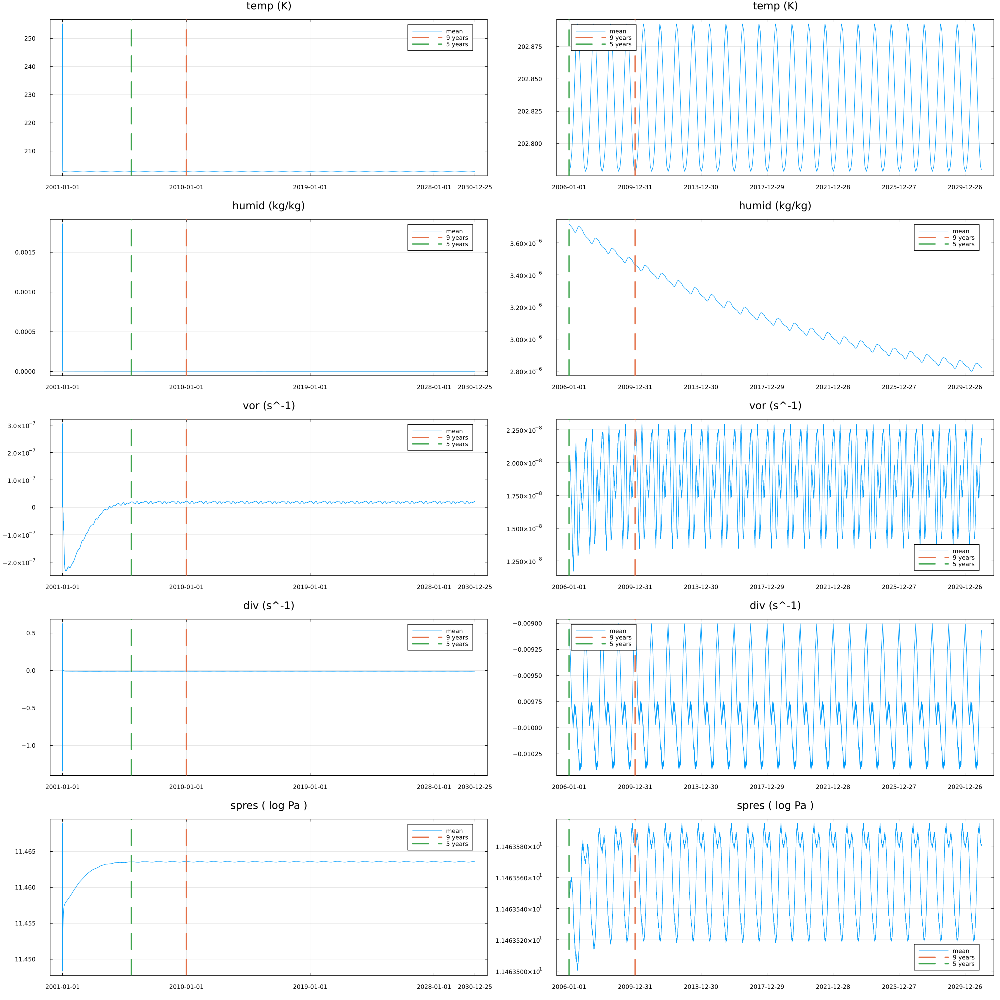

In [12]:
x = collect(LinRange(1,43801,43801))
xticks_labels = ([x[1:start_t:end]; 43801], [Date.(all_time[1:start_t:end]); Date(all_time[end])])

variable = ["temp", "humid", "vor", "div", "spres"]
var_units =[" (K)", " (kg/kg)", " (s^-1)", " (s^-1)", " ( log Pa )"]

all_plots=[]
for i ∈ 1:5
    x = collect(LinRange(1,43801,43801))
    xticks_labels = ([x[1:start_t:end]; 43801], [Date.(all_time[1:start_t:end]); Date(all_time[end])])
    p1 = Plots.plot(means[variable[i]], title = variable[i]*var_units[i], xticks=xticks_labels, framestyle=:box, size=(1000,500), label="mean")
    vline!([start_t], ls=:dash, label="9 years", linewidth= 2.5)
    vline!([7305], ls=:dash, label="5 years", linewidth= 2.5)
    
    push!(all_plots, p1)

    earlier = 7305
    x = collect(LinRange(earlier,43801,36497))
    xticks_labels = (x[1:5840:end], Date.(all_time[earlier:5840:end]))
    p2 = Plots.plot(x, means[variable[i]][earlier:end], title = variable[i]*var_units[i], xticks=xticks_labels, framestyle=:box, size=(1000,500), label="mean")
    vline!([start_t], ls=:dash, label="9 years", linewidth= 2.5)
    vline!([earlier], ls=:dash, label="5 years", linewidth= 2.5)
    push!(all_plots, p2)

end

Plots.plot(all_plots..., size=(2000, 2000), layout=(5,2))
savefig("Figures/means_one_layer.png")

Plots.plot(all_plots..., size=(2000, 2000), layout=(5,2))
